In [35]:
import json
from typing import List

import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from rich import print
import matplotlib.pyplot as plt

from src.blip_modules.blip_text_encoder import BLIPTextEncoder
from src.blip_modules.blip_img_encoder import BLIPImgEncoder
from src.data_utils import targetpad_transform
from src.cirr_experiment.utils import element_wise_sum_original, get_combing_function_with_alpha, \
    convert_to_pivot_cirr, prepare_and_plot_recall_pivot, prepare_ground_truths, plot_retrieval_results_of_i, \
    found_better_than_original
from src.cirr_experiment.validate_notebook import cirr_val_retrieval_text_image_grid_search, compute_results_cirr_val
from src.utils import device

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Set up the experiment</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Set up the cache for the experiment</div>

In [36]:
cache = {}

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [37]:
BLIP_PRETRAINED_PATH = '../../../models/model_base.pth'
MED_CONFIG_PATH = '../../blip_modules/med_config.json'

In [38]:
blip_text_encoder = BLIPTextEncoder(
    BLIP_PRETRAINED_PATH, 
    MED_CONFIG_PATH,
    use_pretrained_proj_layer=True
)

blip_text_encoder = blip_text_encoder.to(device)
print("blip text encoder loaded.")
blip_text_encoder.eval()

load checkpoint from ../../../models/model_base.pth for text_encoder.
load checkpoint from ../../../models/model_base.pth for text_proj.


blip text encoder loaded.

BLIPTextEncoder(
  (text_encoder): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30524, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (dropout): Drop

In [39]:
blip_img_encoder = BLIPImgEncoder(BLIP_PRETRAINED_PATH)
blip_img_encoder = blip_img_encoder.to(device)
print("blip img encoder loaded.")
blip_img_encoder.eval()

reshape position embedding from 196 to 576
load checkpoint from ../../../models/model_base.pth for visual_encoder.
load checkpoint from ../../../models/model_base.pth for vision_proj.


blip img encoder loaded.

BLIPImgEncoder(
  (visual_encoder): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      (norm): Identity()
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0-11): 12 x Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=768, out_features=768, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=3072, out_features=768, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
      

In [40]:
print('Target pad preprocess pipeline is used')
preprocess = targetpad_transform(1.25, 384)

Target pad preprocess pipeline is used

In [41]:
combining_function_original = element_wise_sum_original

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the MLLM generated text captions</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions</div>

In [42]:
with open('../../../cirr_dataset/cirr_labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)
    
print(f'Total number of text captions: {len(text_captions)}')

Total number of text captions: 4609

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the CIRR dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval</div>

In [43]:
grid_search_alphas = np.arange(0, 1.05, 0.05)
total_result: List[pd.DataFrame] = []

for alpha in tqdm(grid_search_alphas, desc="Grid Search alphas and betas"):
    result = cirr_val_retrieval_text_image_grid_search(
        get_combing_function_with_alpha(alpha),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess,
        cache=cache,
    )
    
    total_result.append(result)

recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3 = convert_to_pivot_cirr(total_result)

Grid Search alphas and betas:   0%|          | 0/21 [00:00<?, ?it/s]

In [44]:
display(recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3)

alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,6.46,6.48,6.48,6.48,6.58,6.65,6.72,6.79,6.96,7.18,...,7.53,7.63,7.89,8.47,8.97,9.97,11.74,15.57,21.86,19.49
0.05,6.43,6.43,6.55,6.67,6.89,6.91,6.89,7.06,7.25,7.44,...,7.85,7.94,8.37,8.99,9.30,10.28,12.41,16.74,22.91,20.35
0.10,6.55,6.72,6.82,6.96,7.03,7.06,7.25,7.39,7.49,7.75,...,8.16,8.40,8.71,9.38,9.69,10.98,13.04,17.56,23.54,21.33
0.15,6.82,6.91,7.06,7.18,7.29,7.44,7.68,7.77,7.92,8.13,...,8.44,8.78,9.14,9.61,10.24,11.79,13.90,18.85,24.64,22.00
0.20,6.89,6.98,7.15,7.41,7.46,7.58,7.70,7.87,8.01,8.16,...,8.75,8.99,9.47,10.02,11.03,12.53,15.04,19.88,25.45,22.65
0.25,6.70,6.89,7.03,7.15,7.29,7.58,7.75,7.94,8.08,8.25,...,8.83,9.33,9.73,10.64,11.50,13.44,15.95,20.86,25.76,23.01
0.30,6.91,6.98,7.06,7.25,7.39,7.49,7.80,8.01,8.35,8.54,...,9.16,9.76,10.31,11.22,12.29,14.25,16.98,21.93,26.17,23.13
0.35,6.72,6.89,6.94,7.10,7.37,7.49,7.87,8.06,8.37,8.61,...,9.50,10.05,10.88,11.82,13.18,15.19,18.46,22.89,26.41,23.42
0.40,6.74,6.96,7.08,7.18,7.20,7.65,7.94,8.25,8.42,8.87,...,9.88,10.48,11.53,12.58,13.94,16.24,19.42,23.25,26.60,23.49


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,23.51,23.63,23.73,23.85,24.01,24.25,24.42,24.61,24.90,25.19,...,25.88,26.45,27.22,28.32,29.66,32.15,36.67,43.60,49.72,41.69
0.05,23.65,23.73,23.92,24.09,24.30,24.49,24.85,25.07,25.47,25.90,...,26.52,27.17,28.01,29.13,31.09,33.46,37.98,45.06,50.97,42.84
0.10,24.09,24.25,24.44,24.59,24.87,25.11,25.28,25.64,26.02,26.38,...,27.22,27.86,28.94,30.23,32.15,35.02,39.39,46.54,52.04,43.82
0.15,24.47,24.68,24.95,25.09,25.40,25.66,25.93,26.17,26.69,27.12,...,28.03,28.87,29.83,31.38,33.63,36.50,40.66,47.84,52.83,44.89
0.20,24.73,24.83,25.02,25.33,25.81,25.97,26.60,27.07,27.46,27.77,...,28.75,29.56,30.83,32.60,34.99,37.84,42.43,49.17,53.65,45.68
0.25,24.83,25.09,25.35,25.71,26.14,26.57,27.03,27.41,27.70,28.18,...,29.49,30.81,32.12,34.32,36.28,39.39,44.06,50.63,53.93,45.73
0.30,24.95,25.23,25.47,25.93,26.36,26.74,27.22,27.65,28.37,28.82,...,30.85,31.98,33.56,35.35,37.60,40.85,45.52,51.64,53.65,46.30
0.35,25.14,25.45,25.74,26.09,26.52,27.03,27.62,28.18,29.01,29.80,...,31.71,32.74,34.68,36.95,39.32,42.79,47.05,52.07,53.31,46.71
0.40,25.14,25.57,25.95,26.29,26.96,27.53,28.08,28.82,29.51,30.52,...,32.74,34.08,35.83,38.08,40.85,44.39,48.12,52.36,53.19,46.69


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,32.96,33.08,33.27,33.37,33.56,33.80,34.15,34.66,35.06,35.66,...,36.79,37.72,39.11,40.78,42.93,46.14,51.02,57.09,61.76,53.10
0.05,33.75,33.80,33.96,34.25,34.42,34.85,35.09,35.52,36.04,36.79,...,38.34,39.23,40.56,42.31,44.44,47.91,52.48,59.03,63.09,54.29
0.10,34.42,34.66,34.87,34.99,35.33,35.80,36.07,36.52,37.36,38.15,...,39.70,40.61,42.07,43.41,46.11,49.61,54.25,60.42,64.46,55.82
0.15,34.63,34.97,35.40,35.59,36.02,36.64,37.14,37.72,38.32,39.08,...,40.99,41.95,43.48,45.13,47.69,51.54,55.61,61.88,65.75,56.88
0.20,35.40,35.71,35.90,36.26,36.67,37.14,37.74,38.22,39.20,39.94,...,41.86,43.53,44.77,46.38,49.01,52.93,57.45,63.50,66.54,57.88
0.25,35.71,36.19,36.57,36.86,37.12,37.84,38.48,38.96,39.78,40.56,...,43.20,44.63,46.38,48.22,51.23,54.51,59.17,64.65,66.97,58.22
0.30,36.04,36.57,37.10,37.55,38.08,38.67,39.42,40.01,40.78,41.66,...,44.34,46.11,47.96,49.94,52.50,56.16,60.66,65.30,66.92,58.55
0.35,36.47,36.95,37.50,38.03,38.77,39.49,40.16,40.78,41.43,42.69,...,45.85,47.50,49.32,51.49,54.20,57.98,62.11,66.01,66.75,58.57
0.40,36.47,37.00,37.65,38.39,39.20,39.87,40.78,41.50,42.72,44.34,...,47.19,49.13,50.87,53.10,55.92,59.60,62.90,66.52,66.32,58.53


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,58.50,58.77,59.03,59.29,59.75,60.06,60.54,61.09,61.68,62.35,...,64.60,65.85,67.42,69.29,71.54,74.91,78.57,82.32,83.90,74.29
0.05,59.82,59.96,60.30,60.66,61.01,61.61,62.23,62.76,63.57,64.41,...,66.71,67.95,69.10,70.94,73.62,76.46,80.15,83.71,84.79,75.56
0.10,60.77,61.23,61.61,62.11,62.47,63.29,63.81,64.70,65.41,66.35,...,68.31,69.34,70.87,72.90,75.25,77.95,81.70,84.67,85.39,76.75
0.15,61.88,62.19,62.83,63.53,64.24,64.96,65.61,66.52,67.11,67.93,...,69.82,70.96,72.52,74.79,76.80,79.77,82.99,85.70,85.91,77.61
0.20,62.69,63.29,63.76,64.60,65.58,66.37,66.99,67.69,68.55,69.39,...,71.13,72.97,74.48,76.30,78.57,81.13,83.88,86.27,86.32,78.26
0.25,63.65,64.10,64.84,65.65,66.61,67.45,68.21,69.03,69.74,70.68,...,73.19,74.38,76.20,78.04,80.10,82.56,84.93,86.96,86.68,79.07
0.30,64.29,65.01,65.77,66.63,67.64,68.43,69.27,70.22,71.04,72.26,...,74.67,76.18,77.66,79.55,81.70,83.52,85.55,87.37,86.70,79.69
0.35,64.67,65.68,66.44,67.35,68.38,69.48,70.53,71.37,72.47,73.52,...,76.32,77.61,79.14,81.03,82.83,84.19,86.25,87.80,86.80,79.65
0.40,65.27,65.99,66.87,67.81,68.86,70.13,71.23,72.49,73.71,74.86,...,77.66,78.67,80.63,82.21,83.62,85.29,86.77,88.04,86.68,79.72


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,20.69,20.74,20.90,21.12,21.36,21.43,21.60,21.79,22.03,22.48,...,23.44,23.97,24.68,26.07,27.86,30.54,35.09,41.86,52.83,59.99
0.05,20.69,20.74,20.98,21.26,21.41,21.57,21.79,22.00,22.34,23.13,...,24.13,24.59,25.57,27.22,28.82,31.60,36.26,43.41,53.79,61.04
0.10,20.47,20.69,21.00,21.19,21.43,21.77,22.27,22.53,22.87,23.54,...,24.49,25.21,26.45,28.01,29.66,32.70,37.41,44.58,54.70,61.56
0.15,20.38,20.64,20.90,21.19,21.57,21.93,22.53,23.10,23.42,23.97,...,25.09,25.97,27.36,28.58,30.69,34.06,38.87,46.30,56.11,62.02
0.20,20.33,20.55,20.93,21.31,21.67,22.20,22.75,23.13,23.87,24.40,...,25.97,26.93,27.94,29.63,32.07,35.49,39.89,48.07,57.02,62.64
0.25,20.19,20.43,20.83,21.33,21.60,22.27,22.91,23.58,24.18,24.87,...,26.41,27.48,28.80,31.14,33.51,37.10,41.33,49.20,57.88,63.21
0.30,20.21,20.71,21.02,21.60,22.10,22.58,23.10,23.73,24.73,25.42,...,27.15,28.44,30.30,32.29,34.90,38.56,42.81,50.23,58.48,63.36
0.35,20.26,20.64,20.95,21.50,22.27,22.82,23.32,24.30,25.09,26.19,...,28.06,29.73,31.60,33.48,36.52,39.99,44.44,51.73,58.69,63.45
0.40,20.38,20.88,21.43,21.77,22.51,23.30,24.06,24.73,25.74,26.84,...,29.35,31.07,32.86,35.23,38.17,41.28,45.99,52.79,59.17,63.48


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,41.95,42.02,42.10,42.31,42.69,43.03,43.36,43.82,44.37,44.89,...,46.50,47.62,48.84,50.37,52.55,55.61,60.30,66.85,74.65,79.50
0.05,42.00,42.19,42.43,42.69,43.00,43.51,43.77,44.32,44.77,45.66,...,47.33,48.62,49.80,51.42,53.70,56.73,61.37,68.26,75.32,79.89
0.10,42.26,42.50,42.69,42.93,43.22,43.87,44.46,44.94,45.54,46.26,...,48.29,49.41,50.90,52.67,54.94,57.83,62.74,69.00,75.94,80.27
0.15,42.38,42.69,43.00,43.36,43.94,44.42,44.87,45.28,46.21,46.74,...,49.51,50.92,52.04,53.62,56.06,59.32,63.88,70.41,76.85,81.10
0.20,42.36,42.81,43.55,44.01,44.39,45.04,45.47,46.14,46.90,47.81,...,50.37,51.71,53.17,54.72,57.14,60.61,65.03,71.18,77.49,81.49
0.25,42.26,42.88,43.39,43.98,44.63,45.40,46.23,46.83,47.96,49.01,...,51.45,52.57,54.03,55.85,58.69,62.26,66.68,72.16,77.97,81.82
0.30,42.17,42.84,43.31,44.08,44.87,45.61,46.64,47.72,48.94,49.87,...,52.26,53.81,55.30,56.92,60.13,63.60,68.07,72.93,78.23,81.85
0.35,42.21,42.67,43.41,44.30,45.32,46.19,47.05,48.27,49.61,51.02,...,53.58,54.96,56.61,58.65,61.73,65.44,69.41,73.55,78.55,82.09
0.40,42.21,42.79,43.67,44.51,45.66,46.62,47.81,48.84,50.11,51.59,...,54.60,56.30,58.14,60.56,63.41,66.56,70.68,74.22,78.98,81.77


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,62.02,62.16,62.45,62.62,62.86,63.17,63.48,64.03,64.67,65.22,...,66.87,67.73,69.05,70.77,72.30,74.86,78.14,82.28,87.23,89.09
0.05,62.02,62.21,62.62,62.93,63.36,63.74,64.12,64.55,65.15,65.97,...,67.50,68.76,70.27,71.71,73.59,75.70,78.78,83.04,87.90,89.38
0.10,62.09,62.28,62.76,63.07,63.69,64.03,64.58,65.32,65.94,66.66,...,68.48,69.74,71.16,72.54,74.53,76.70,79.55,83.81,88.35,89.79
0.15,62.21,62.74,63.09,63.55,64.22,64.79,65.37,66.01,66.73,67.35,...,69.43,70.65,71.87,73.48,75.32,77.47,80.58,84.24,88.59,90.19
0.20,62.33,62.69,63.29,63.98,64.58,65.56,66.11,67.11,67.78,68.50,...,70.17,71.39,73.00,74.36,76.11,78.19,81.68,84.74,88.52,90.55
0.25,62.50,62.95,63.60,64.41,65.25,65.92,66.83,67.47,68.40,69.29,...,71.32,72.54,73.93,75.27,76.92,79.31,82.35,85.51,88.90,90.82
0.30,62.40,63.14,63.62,64.55,65.46,66.44,67.35,68.07,69.17,70.17,...,72.06,73.52,75.03,76.35,78.16,80.51,82.99,86.06,89.19,91.08
0.35,62.35,63.00,63.79,64.84,65.82,66.54,67.69,68.76,69.67,70.70,...,72.76,74.53,75.94,77.57,79.22,81.42,83.50,86.87,89.50,91.22
0.40,61.99,62.93,64.03,64.94,66.01,67.16,68.05,69.10,70.13,71.51,...,73.93,75.58,77.04,78.59,80.27,82.18,84.17,87.01,89.69,91.34


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [45]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall results</div>

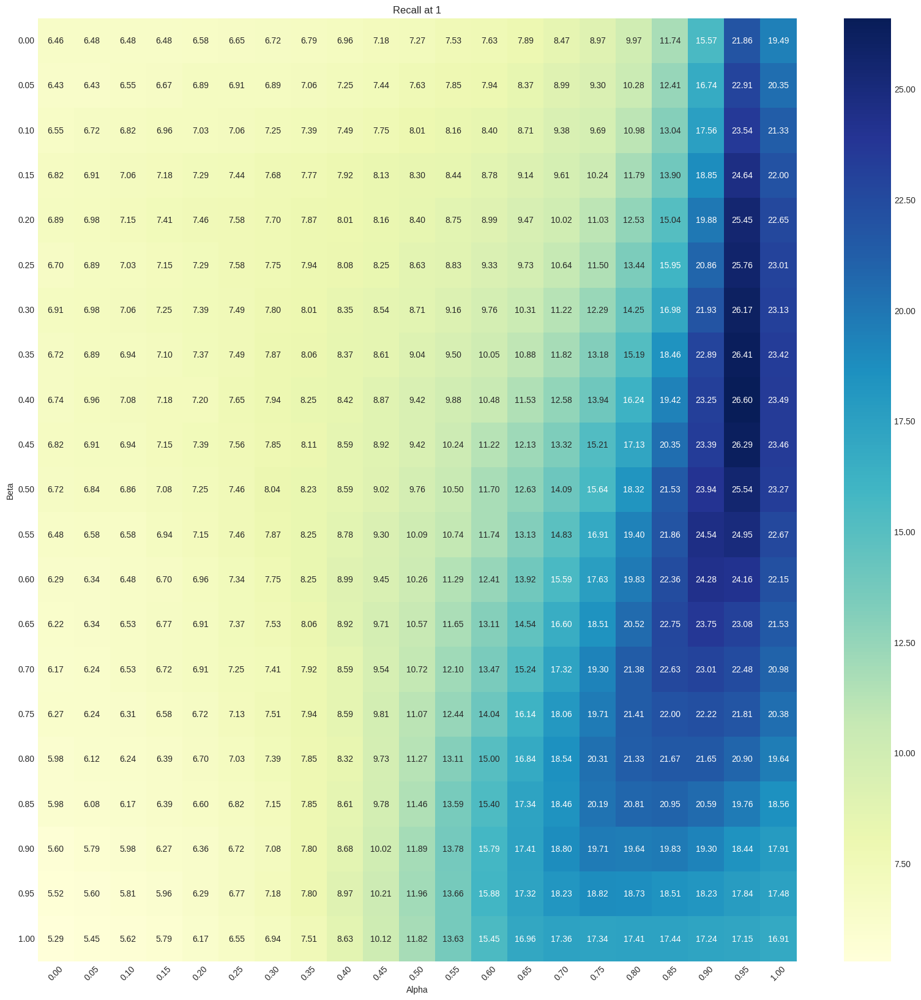

In [46]:
prepare_and_plot_recall_pivot(recall_at1, 'Recall at 1')

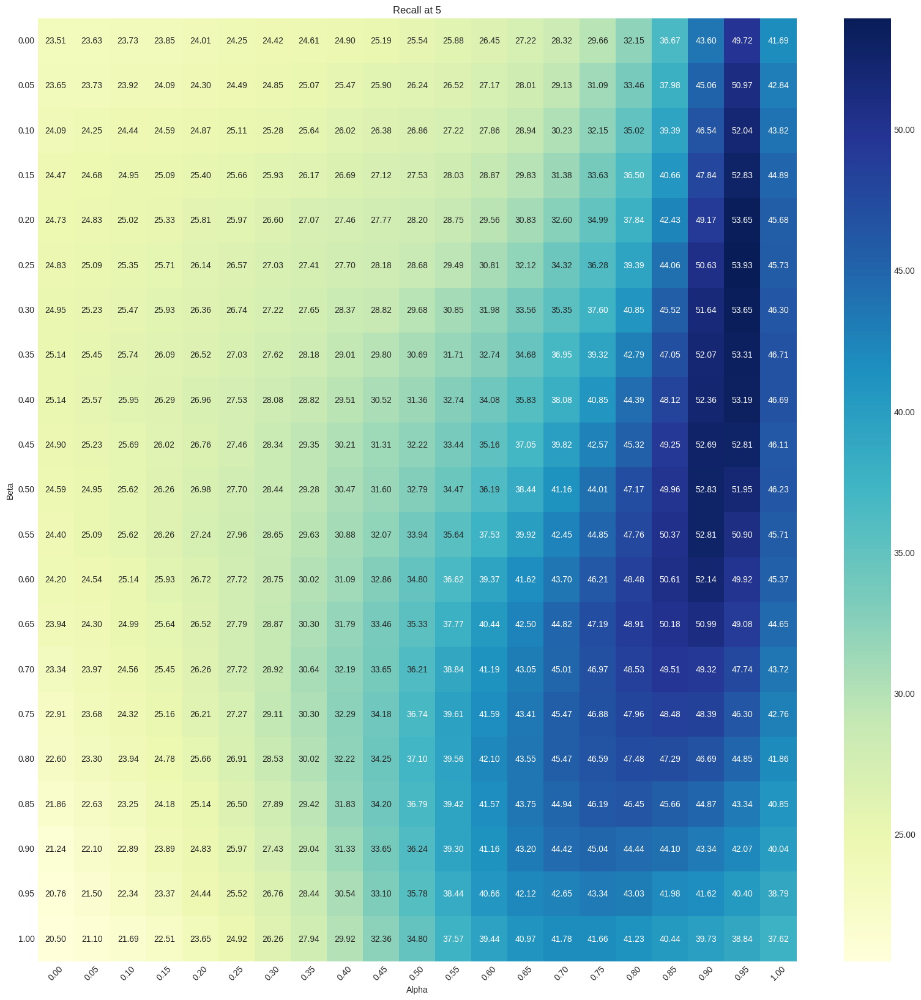

In [47]:
prepare_and_plot_recall_pivot(recall_at5, 'Recall at 5')

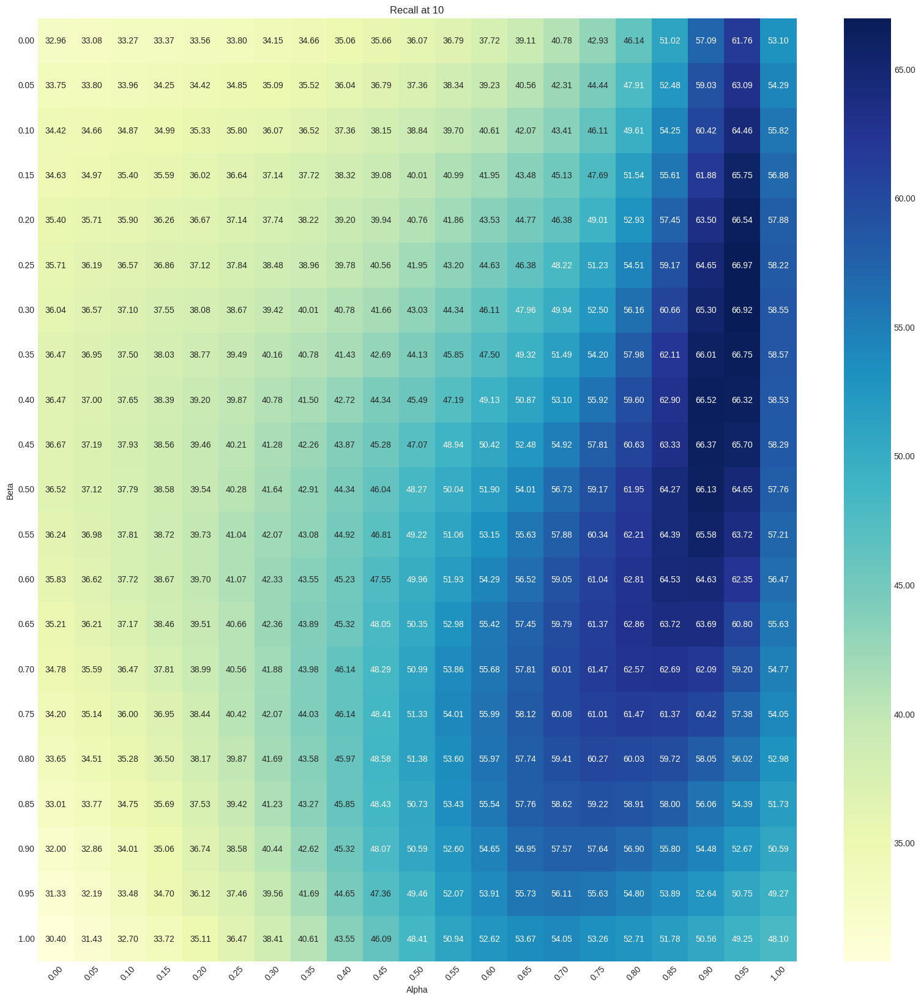

In [48]:
prepare_and_plot_recall_pivot(recall_at10, 'Recall at 10')

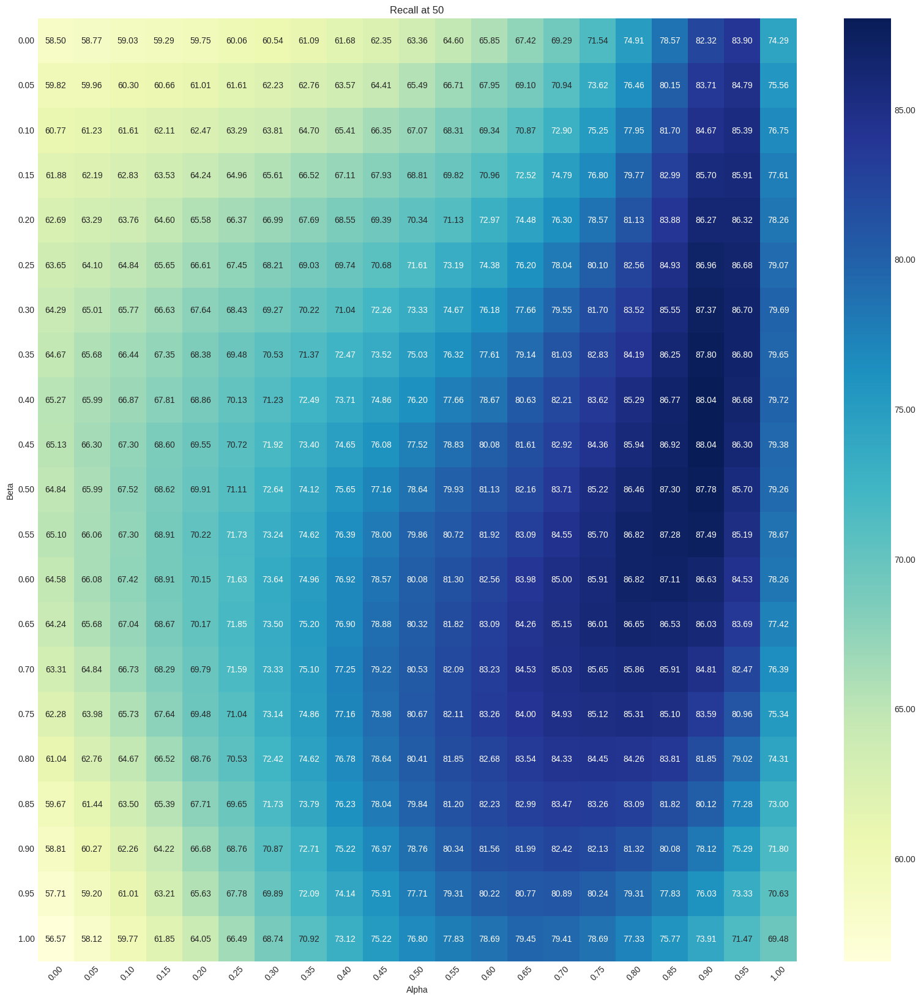

In [49]:
prepare_and_plot_recall_pivot(recall_at50, 'Recall at 50')

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the group recall results</div>

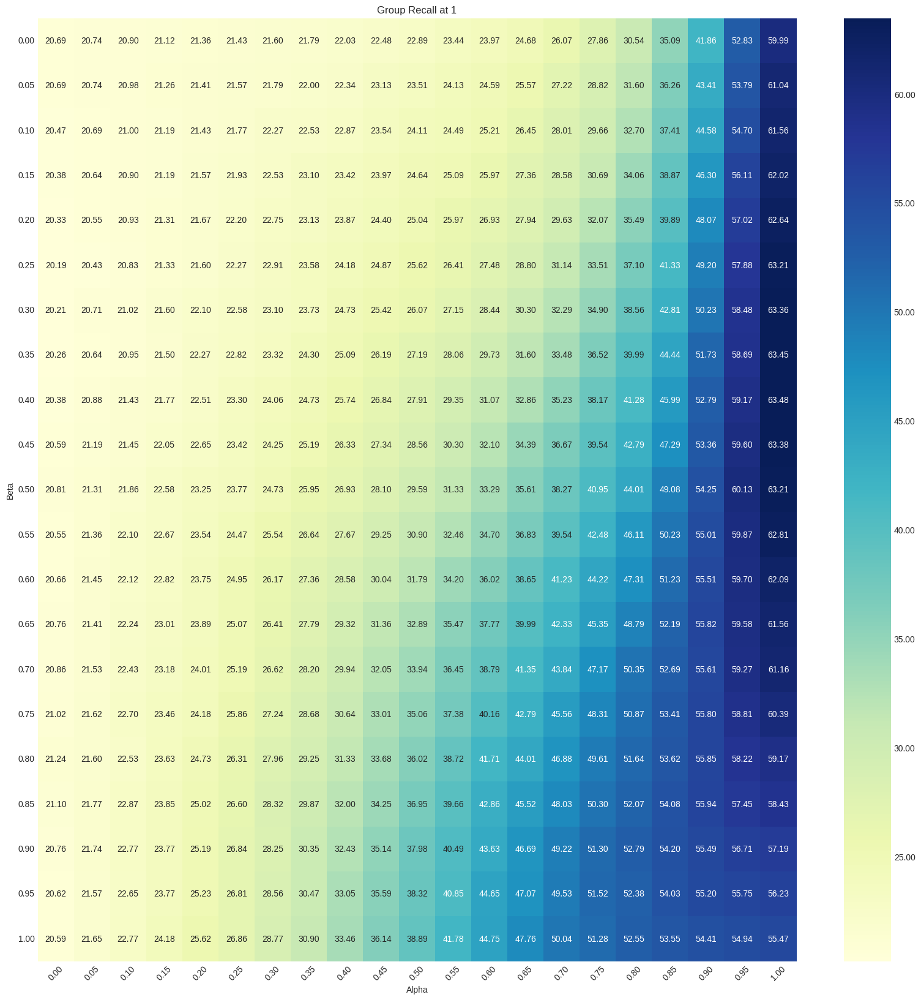

In [50]:
prepare_and_plot_recall_pivot(group_recall_at1, 'Group Recall at 1')

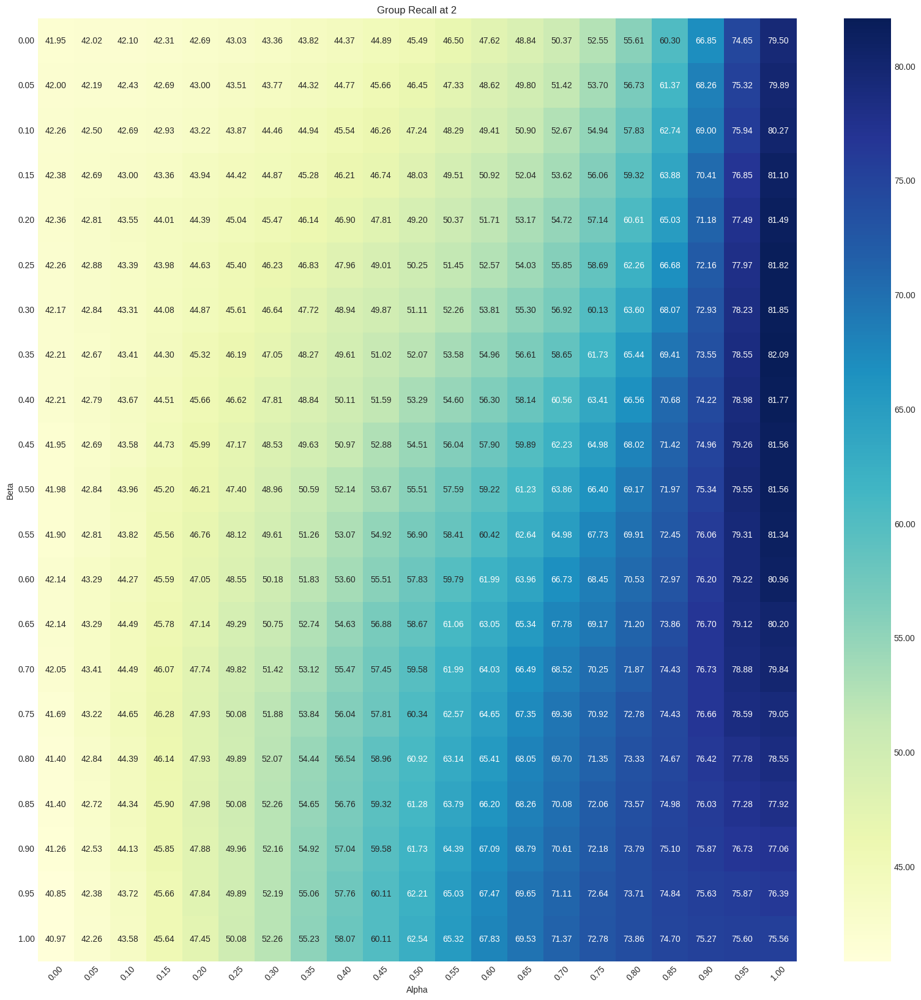

In [51]:
prepare_and_plot_recall_pivot(group_recall_at2, 'Group Recall at 2')

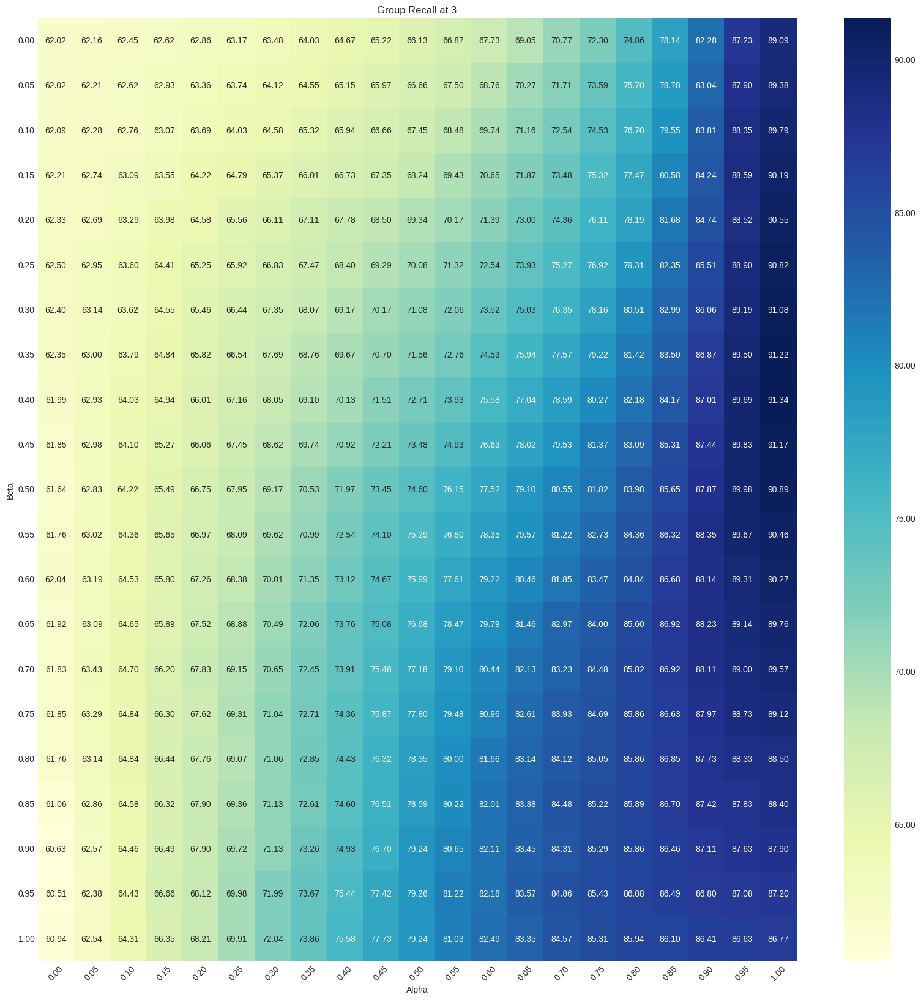

In [52]:
prepare_and_plot_recall_pivot(group_recall_at3, 'Group Recall at 3')

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results</div>

In [53]:
sorted_indices, image_index_names, target_names = compute_results_cirr_val(
    get_combing_function_with_alpha(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    beta=0.2,
    cache=cache,
)

Recall Results
Recall at 1: 25.45
Recall at 5: 53.65
Recall at 10: 66.54
Recall at 50: 86.32
Group Recall Results
Group Recall at 1: 57.02
Group Recall at 2: 77.49
Group Recall at 3: 88.52


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [54]:
ground_truth = prepare_ground_truths(json.load(open('../../../cirr_dataset/cirr/captions/cap.rc2.val.json')))

DATASET_IMAGE_DIR = '../../../cirr_dataset/dev/'

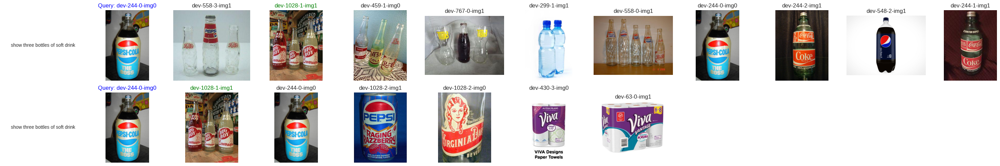

In [55]:
plot_retrieval_results_of_i(
    sorted_indices, 
    image_index_names, 
    target_names, 
    ground_truth, 
    top_k=10, 
    i=0,
    directory=DATASET_IMAGE_DIR,
)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with the original without MMLM captions and identical weights element-wise sum</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [56]:
sorted_indices_origin, image_index_names_origin, target_names_origin = compute_results_cirr_val(
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    beta=0,
    cache=cache,
)

Recall Results
Recall at 1: 7.27
Recall at 5: 25.54
Recall at 10: 36.07
Recall at 50: 63.36
Group Recall Results
Group Recall at 1: 22.89
Group Recall at 2: 45.49
Group Recall at 3: 66.13


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [57]:
become_better = found_better_than_original(
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    sorted_indices, image_index_names, target_names,
    top_k=10
)

len(become_better), become_better[:10]

(1480, [0, 6, 14, 15, 19, 30, 52, 54, 56, 57])

In [58]:
become_worse = found_better_than_original(
    sorted_indices, image_index_names, target_names,
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(202, [22, 24, 31, 66, 98, 106, 134, 152, 183, 201])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

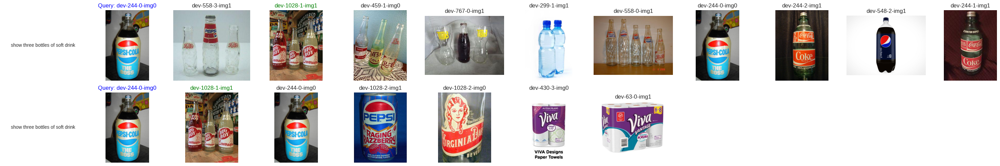

In [59]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=0)

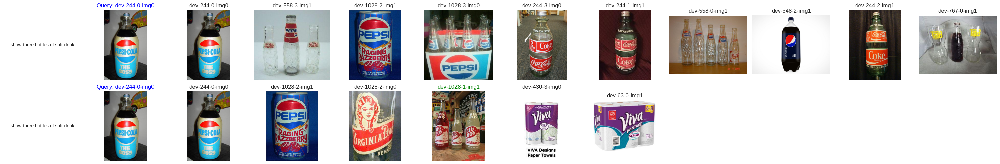

In [60]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=0)

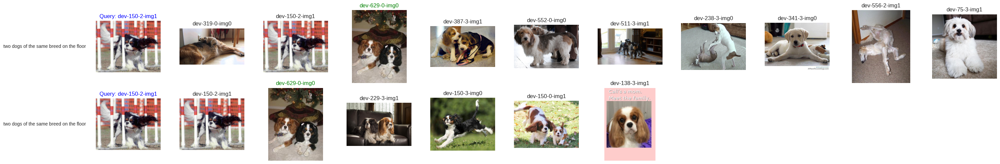

In [61]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=6)

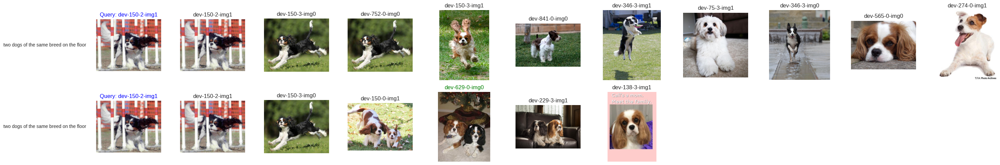

In [62]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=6)

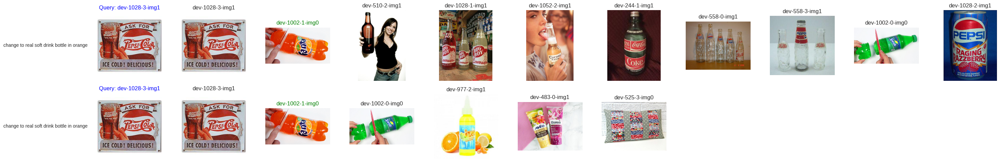

In [63]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=19)

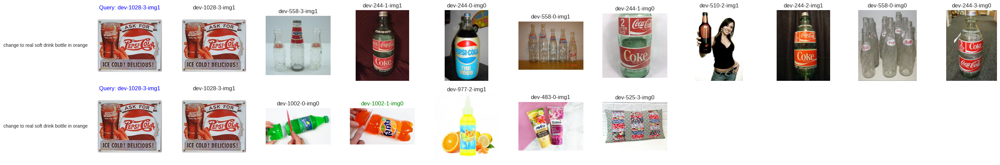

In [64]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=19)